# Lecture 29 & 30.

REMINDER: https://omar-hussein.medium.com/quick-fix-on-choosing-the-right-visualization-chart-944278f80011

# Exploring Data Relationships with Visual Aggregation.

We can explore data relationships in various ways. For instance, certain plot types highlight different aspects of the data or allow you to compare one data point with another.

For a simplified example of data-point comparison, let’s generate a DataFrame that contains a direct relationship between two data elements, AK and CA. (AK is the abbreviation for Alaska, and CA is the abbreviation for California.) In the data that the following code generates, the CA data mathematically relates to the AK data:

In [2]:
import numpy as np
import pandas as pd

ak_data = np.arange(100)
bias = np.random.uniform(0, 10, 100)
ca_data = 2*ak_data + bias
df = pd.DataFrame({
    "AK": ak_data,
    "CA": ca_data
})

Next, we plot this data by using an hvPlot scatter plot with AK on the x-axis and CA on the y-axis, as the following code demonstrates:



In [4]:
import hvplot.pandas

df.hvplot.scatter(x="AK", y="CA")

:Scatter   [AK]   (CA)

The following image shows the resulting plot, which shows that AK increases as CA increases—indicating a relationship between the two:

A simple plot that specifies the x-axis and y-axis (like this one) can prove effective in illustrating patterns and relationships between distinct values. However, when the data involves groups, we might need to manipulate the plot or the DataFrame to correctly format the data for plotting. However, no one likes to spend all that extra time on code—we have data stories to tell and financial sectors to disrupt!

Luckily, hvPlot helps us automatically visualize groups with widgets. Widgets are functional elements in a plot that allow us to easily change the visualization. This way, we can highlight how each group affects the overall plot, the relationships among different groups, and how the analysis might change if we change the groups. As an example, let’s use the hvPlot widgets to interactively explore housing prices by zip code.

# Use Groups and Widgets.
To apply the hvPlot widgets to groups, we need to add the groupby parameter to the hvplot function call. This tells hvPlot to group the prices by zip code. The following code shows this:




In [ ]:
houses_df.hvplot(groupby="zip")

Watch Video: https://courses.bootcampspot.com/courses/800/pages/6-dot-1-5-exploring-data-relationships-with-visual-aggregation?module_item_id=235255

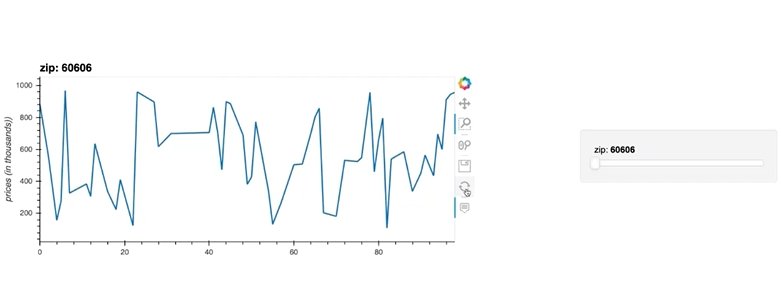

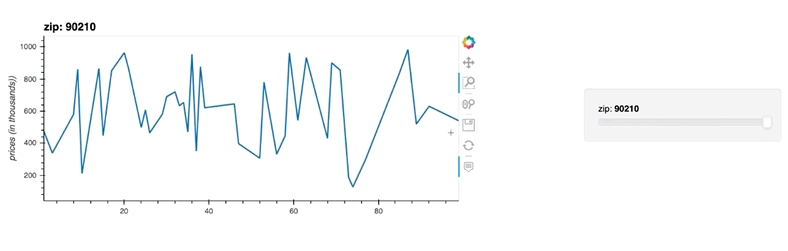

To change the zip code, we toggle, or drag, the slider to its left side to access data for zip code 60606, or its right side to access data for zip code 90210. This is a quick way to explore the data in each group, which will help us uncover patterns and relationships within a particular group.

Before moving on, try the following Skill Drill.

Because a zip code is a series of numbers, hvPlot selected the slider widget. Because a state abbreviation has a different data type, it selected a dropdown menu. It automatically customizes the plot and widget type for the data that we’re working with. However, options exist for overriding its selections. To learn about these options, refer to Widgets (Links to an external site.) in the official hvPlot documentation.

Next, you’ll use visual aggregation with hvPlot to explore real financial data.

Activity: https://courses.bootcampspot.com/courses/800/pages/6-dot-1-6-activity-exploring-medical-payments?module_item_id=235258

# Location-Based Data in Fintech.

In the fintech industry, location often plays a critical role in the understanding of financial and economic data. For example, fintech lenders use mapping technologies to define geographic regions. Specifically, they define geographic regions where demographics and economic factors indicate both the need for loans and the best opportunities for repayment. Ride-share car services use similar location-based technologies to identify the areas where they’ll most likely encounter individuals in need of a ride.

Understanding how potential opportunities, resources, and clients are geographically distributed—from the neighborhood level to the entire globe—is key to establishing a successful business. Technology allows businesses to target markets well beyond their immediate locations. Access to almost-infinite amounts of data means that businesses can scour the globe for opportunities. With location-based technologies, firms can visualize the distribution of data and pinpoint the locations where the best business opportunities exist.

Previously, you used interactive visualizations to explore the patterns and relationships in your data—without using a lot of code. In this lesson, you’ll create interactive maps for geospatial data, or location-based data, by using both the 

`Plotly Express visualization library and the Mapbox API.`

Before we dive into creating visualizations, let’s explore the concept of geospatial data in more detail.
--------------------
spatial:

    Learn to pronounce
    adjective
    relating to or occupying space.
    "the spatial distribution of population"



# Understanding Geospatial Data

Geospatial data is another term for location-based data. Geospatial data typically includes coordinates (longitudes and latitudes), addresses, and zip codes. It also typically includes information like cities, counties, states, provinces, or countries/regions. By basing visualizations on geospatial data, we can observe how the data is distributed across a specified location.

Let’s consider an example. The following image shows a map of the United States that distinguishes states by nominal gross domestic product (GDP):

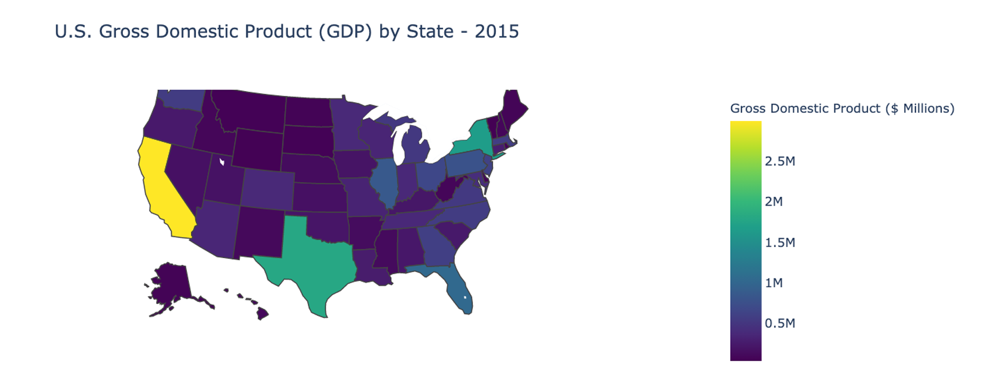

Both businesses and consumers use geospatial data. Businesses use this data to target consumer hot spots, identify trends, or get economic information. Consumers use geospatial data and services to estimate travel times, determine traffic patterns, and find missing devices.

Exploring geospatial data can help us understand how location and distribution affects the patterns and relationships in our data.

The next question is, when we do have geospatial data, how do we visualize it? Let’s review the tools that we’ll use to incorporate this new addition into your fintech tool kit.


# Reviewing Your Visualization Tools.

In this lesson, you’ll use Plotly Express and Mapbox to build your geospatial visualizations. Plotly Express is a powerful visualization library that can produce advanced charts and interactive visualizations. We’ll use Plotly Express to create interactive maps for our geospatial data. To make sure that we plot our data on current and accurate maps, we need to get current and accurate map data. We can get this data from an API service like Mapbox. Mapbox offers open-source map APIs that provide a range of map data for creating state-of-the-art, interactive map plots.

Mapbox offers advanced `customization tools` and `navigation` and `search services`. These services come with their own sets of tools, including different `map styles, vectors, images, and datasets.`

Next, let’s practice using the Mapbox API.

# Use the Mapbox API


The Mapbox API is the primary component in our geospatial visualization tool kit. The Plotly library includes the Plotly Express module, which has built-in functionality that is designed for interacting with the Mapbox APIs. Specifically, Plotly Express uses the Mapbox API to create interactive map visualizations. It can create maps by using geospatial data values, like the latitude and longitude, country name, or zip code.

The following code blocks integrate Plotly Express and Mapbox to create a map visualization.

First, we import the required libraries:

In [1]:
# Import the required libraries

import plotly.express as px

import pandas as pd
import os
from pathlib import Path
from dotenv import load_dotenv

### Step 2

Second, we add the required steps for setting up the Mapbox API access token:

In [ ]:
# Load the Mapbox API access token from the .env file
load_dotenv()

# Create the Mapbox API access token variable
map_box_api_access_token = os.getenv("MAPBOX_API_ACCESS_TOKEN")
type(map_box_api_access_token)

# Set the Mapbox API access token to the users API key
px.set_mapbox_access_token(map_box_api_access_token)

### Step 3

Third, we read the data from a file—in this case, population_counts.csv—into a Pandas DataFrame and then review it:

In [ ]:
# Read in the data from the "population_counts.csv" file into a Pandas DataFrame
population_df = pd.read_csv(
    Path('../Resources/population_counts.csv')
)

# Review the first five rows of the DataFrame
population_df.head()

### Step 4

Fourth, we have to do some data cleaning and preparation before we can plot our geospatial data on a map. The following code block uses a filter to select the data for California and the year 2016 and then drops any duplicated rows:

In [ ]:
# Select the population data for the state of California
ca_population_data = population_df[population_df['StateDesc'] == 'California']

# Select the population for the year 2016
california_population_data = ca_population_data[ca_population_data['Year'] == 2016]

# Remove duplicates from the DataFrame
california_population_data = california_population_data.drop_duplicates()

# Review the first and last five rows of the DataFrame
display(california_population_data.head())
display(california_population_data.tail())

Finally, we can create our first geospatial visualization. For this example, we’ll use `scatter_mapbox` from Plotly Express.

With scatter_mapbox, we can plot the location of each data point on a map by supplying the name of the Dataframe being used, followed by the `lat`and `lon` parameters. In the case of our california_population_data Dataframe, the `lat` and `lon` parameters should receive the column names Latitude and Longitude, respectively.

We can also control other aspects of the plot, such as the size and color of the data points, as well as the zoom setting and the size of the plot itself. In this example, we’ll let the size vary by `PopulationCount`This will give us bigger circles for bigger populations and smaller circles for smaller populations. We’ll also assign `CityName` .
to the color. This will give us a differently colored circle for each city name in the data. Finally, we set map zoom to 4 and the plot height to 750.

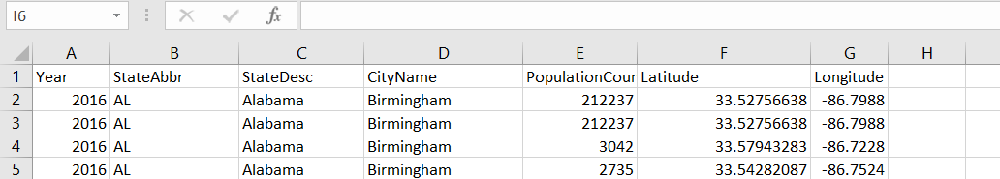

In [ ]:
# Plot data using Plotly and the Mapbox scatter plot
px.scatter_mapbox(
    california_population_data,
    lat='Latitude',
    lon='Longitude',
    size='PopulationCount',
    color='CityName',
    zoom=4,
    height=750
)

The following image shows the resulting visualization:
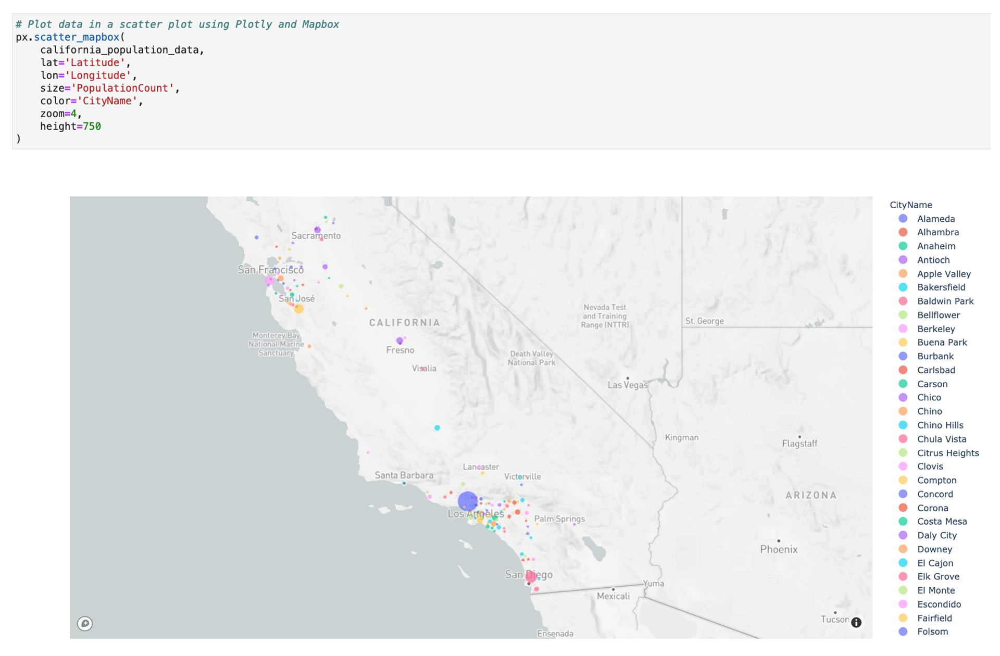


That was lots of code, but you can observe the power of Plotly Express and Mapbox for visualizing geospatial data. With just a single code function, we can visualize the geographical relationships in our data and better understand that data.

For example, we can notice the differences in population sizes. In this example, the large blue circle represents Los Angeles, which has the highest population density, but San Diego isn't that far behind. Perhaps, it’s the underdog in this story and worth exploring more deeply.

This exploration and understanding of geospatial relationships is exactly how fintech has been able to disrupt traditional financial markets. Let's examine one such area of disruption that fintech has succeeded at: real estate.

# Use Case: Geospatial Data in Real-Estate Analysis

In this part of the lesson, we’ll explore how we can integrate Plotly Express and the Mapbox API to create dynamic visualizations for real-estate data. These visualizations will enhance our analyses by offering insight into the geospatial data that we’re working with.

Let's use the dataset from our previous example to interactively explore and analyze opportunities in the California real-estate market.

## Analyze the Geospatial Data.

Say that we want to identify the three or four most densely populated cities in California. We want to launch our company’s long-term housing rental initiative and corresponding ad campaign in these cities. We have access to the 2016 population data for the state of California that’s broken down by city and by latitude and longitude. With this information, we can determine the relative population of each city in California and how the population is distributed across the state.

The following image shows the first and the last five rows of the california_population_data DataFrame, which contains columns for Year, StateAbbr (state abbreviation), StateDesc (state name), CityName, PopulationCount, Latitude, and Longitude.


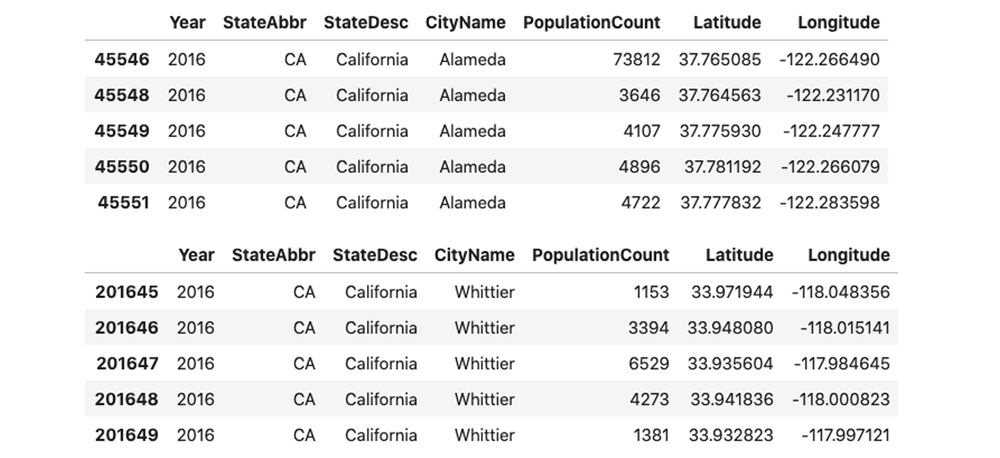

Notice that the DataFrame lists the coordinates for each city’s latitude and longitude. With this information, the Plotly/Mapbox integration can render the map with incredible accuracy. Additionally, by aggregating these latitude and longitude points by city name, Plotly/Mapbox can render the scatter plot points by city name and color.

Once again, here’s the code to generate the Plotly/Mapbox visualization:

In [ ]:
# Plot data in a scatter plot using Plotly and Mapbox
px.scatter_mapbox(
    california_population_data,
    lat='Latitude',
    lon='Longitude',
    size='PopulationCount',
    color='CityName',
    zoom=4,
    height=750
)

When we plot the DataFrame as a map, we can notice that Los Angeles has the largest scatter-plot circle on the map. This indicates that Los Angeles is more densely populated than any other city in the state, as the following image shows:


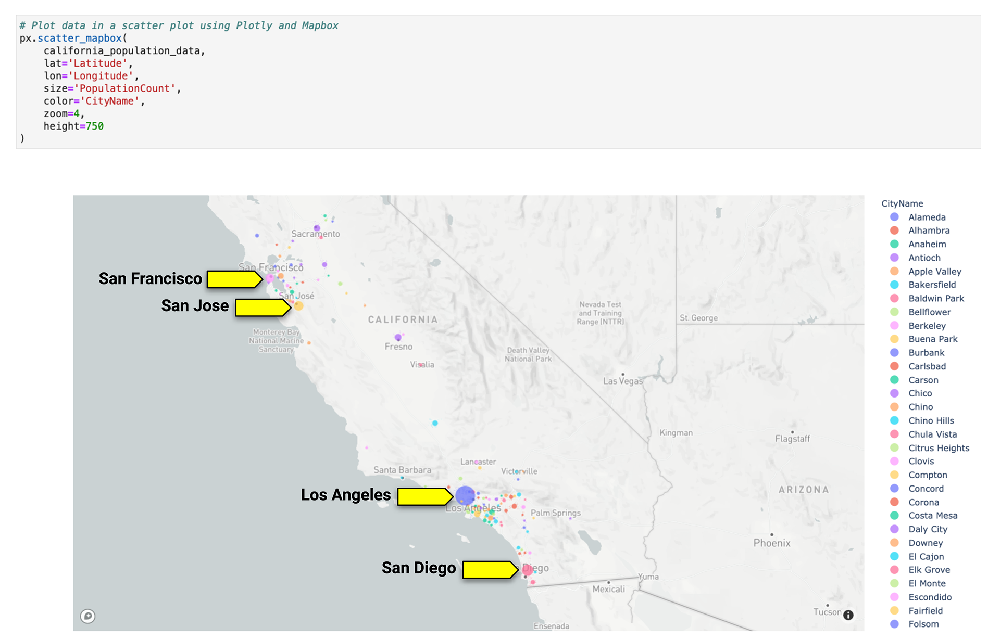

ncorporating the Plotly visualization tools enhances our analysis. To confirm the sizes of the relative circles, we can zoom in on specific areas of the state in several ways. We can use the tool’s "Zoom in" button, which has a plus sign (+) icon. Alternatively, we can use a laptop trackpad or a mouse. Additionally, we can confirm the population density values by using the “Toggle show closest data on hover” tool, which has a left-pointing arrow icon. With the “Pan” tool, an icon with arrows pointing in four directions, we can navigate from one part of the map to the other, as the following video shows:

Watch 1 min video: https://courses.bootcampspot.com/courses/800/pages/6-dot-2-4-use-case-geospatial-data-in-real-estate-analysis?module_item_id=235273

Now, let’s consider how to use this information for the company’s ad campaign. The map shows that the four largest cities in California are somewhat distant from each other. Two are located in the northern half of the state, and the other two are located in the southern half.

Given the geographic locations of these cities, it might make sense to create two ad campaigns. We can gear each campaign toward the specific interests, industries, and economic conditions of the state region (north or south). For example, ads for the San Francisco and San Jose markets might focus on the software industry, San Francisco sports teams, or outdoor activities (like hiking and camping). Ads for the Los Angeles and San Diego markets might focus on the entertainment industry or water sports (like surfing and sailing).

We’d find it difficult to think of campaign ideas for these markets based on the location-based tabular data alone. We need the map and the plot to understand the relationships among the mostly-densely populated cities.

Activity: https://courses.bootcampspot.com/courses/800/pages/6-dot-2-5-activity-plotting-foreclosures?module_item_id=235276

# Visual Communication

## Communicating Through Visualizations.

So far, you’ve used various types of data visualizations to explore data, identify connections and relationships in the data, and integrate geospatial data into your analysis. And now, you’ve made it to the final step: leveraging all that information to communicate your insights in a visual format.

Visual communication goes beyond displaying charts and graphs. It also means strategically using visual elements, like colors, shapes, sizes, and composition—including combining multiple plots. The goal is to highlight key patterns and relationships in your data story so that your audience can understand your analysis. Your audience might range from a fund manager making investment decisions based on stock performance to a real-estate firm making buying decisions based on housing foreclosure information. Regardless of the scenario, you need to communicate your analysis in an efficient, informative, and engaging way. With visual communication, you can distill pages of explanatory text into a concise, interactive tool that supports your audience in their decision-making process.

In this lesson, you’ll learn how to customize your visualizations to highlight important features of your data. You’ll also learn how to create composite visualizations that combine information in ways to help communicate your data insights.

# Creating Customized Visualizations.

Visual communication relies on your ability to create customized visualizations. Specifically, you want these visualizations to enhance your audience’s understanding of the information that you’re presenting. How your visualizations incorporate 
  - The following
    - Color
    - size
    - shape
    - chart options 

can have a tremendous impact on how your audience digests the information.

With visualization options, we can customize and curate our visualizations. Advanced options exist for customizing 
- titles
- fine-tuning axes labels
- formatting plots with attractive color themes. 
---------------------------------------------------------------------------------------------------
They also exist for adding effects, such as those for on-hover, selection, and deselection events. And our old friend, the hvPlot library, has the necessary functions for incorporating these custom visualization options. Let’s put some of these options into practice.

# Using Advanced Visualization Options

As a real-estate agent located near Arlington, Virginia, you notice that sales during June 2019 seemed particularly light. You access a list of the housing sales in your area. Your goal is to now visualize the number of sales per day over the month. Let’s go through the steps to create a visualization and then apply advanced visualization options to gain deeper insights.

Import the Data and Create the DataFrame,

The first step to achieve this goal—visualizing the number of Arlington housing sales per day in June 2019—is to read in the data from housing_sale_data.csv and create the DataFrame from your collected data, as the following code shows: https://courses.bootcampspot.com/courses/800/files/677541/download

In [ ]:
# Import the required libraries and dependencies
import pandas as pd
from pathlib import Path
import hvplot.pandas

# Using the read_csv function and Path module, read in the “housing_sale_data.csv” file
# and create Pandas DataFrame
Home_sale_prices_df = pd.read_csv(
    Path('../Resources/housing_sale_data.csv'),
    index col = 'salesHistoryKey’
)

# Review the first and last five rows of the DataFrame
display(home_sale_prices_df.head())
display(home_sale_prices_df.tail())

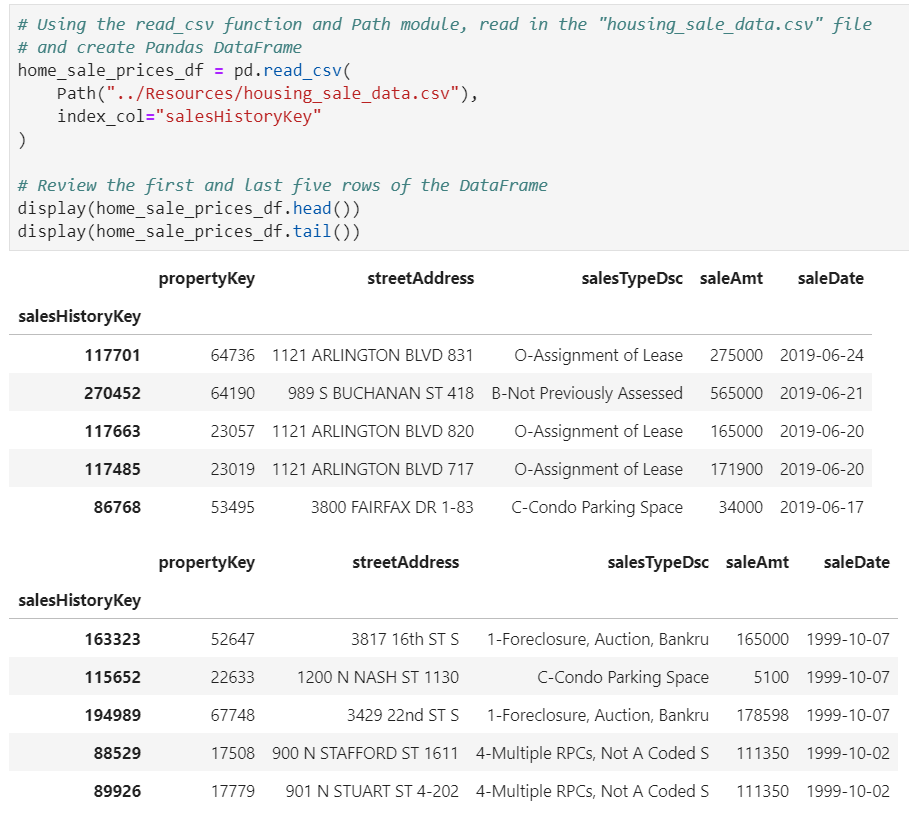

This DataFrame contains sales data from 1999-10-02 to 2019-06-24. We want to focus on the sales only during June 2019, so let’s filter our data. To do so, we use the loc function along with conditional and logical operators, as the following code shows:

In [ ]:
# Using loc as well as conditional and logical operators, slice the data
# to only capture the information for June 2019
home_sale_prices_june_2019= home_sale_prices.loc[
      (home_sale_prices["saleDate"] >= "2019-06-01")
      & (home_sale_prices["saleDate"] <= "2019-06-30")
]

# Review the first and last five rows of the resulting DataFrame
display(home_sale_prices_june_2019.head())
display(home_sale_prices_june_2019.tail())

As the following image shows, the new DataFrame contains the housing sales data from only June 2019:

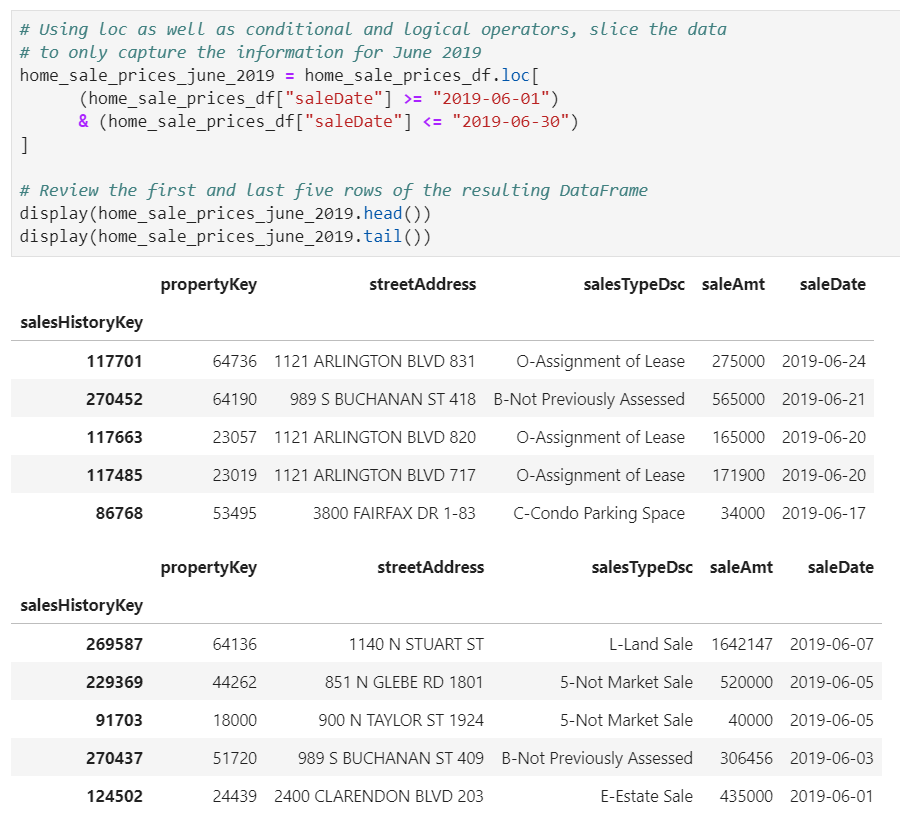

Great! Now we have the data for the month of June. But the task is to evaluate the changes in the amount of sales per day. To do this, we need to group the data by sale date.

# Group the Data

We’ll group the June data by the "saleDate" column and then sum the sales from each date, as the following code shows:

In [ ]:
# Create a DataFrame containing the amount of housing sold for each day in June
# Using the "saleAmt" and "saleDate" columns from the June sales DataFrame,
# groupby "saleDate" and then sum the sale amount for each date
june_sale_amt_date = (
    home_sale_prices_june_2019[["saleAmt", "saleDate"]]
    .groupby("saleDate")
    .sum()
    .sort_values("saleDate")
)

# Review the resulting Series
june_sale_amt_date

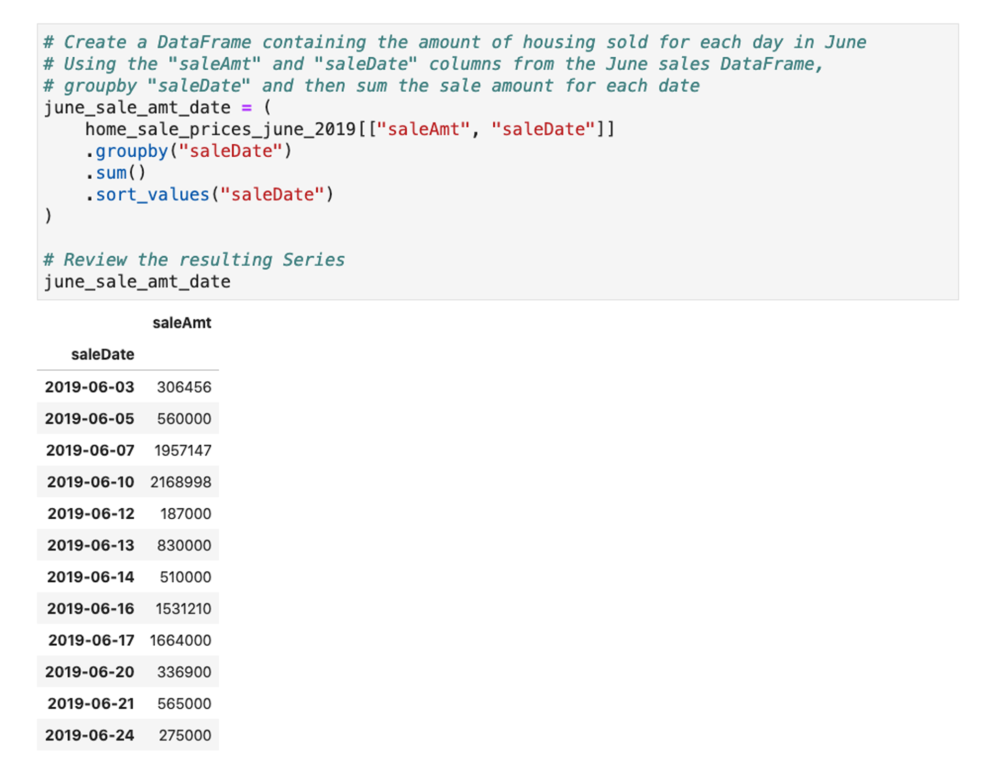

Now that the data we want exists in the correct format—the June housing sales data grouped by day—we can begin to visualize the information.

# Visualize the Data in a Bar Chart.

Let’s start by using hvPlot to plot a bar chart, as the following code demonstrates. Notice that this code specifies axis labels and a title for the chart, which we provide as parameters to the hvplot function.


In [ ]:
# Plot a bar chart of the June sale data using hvPlot .
# Specify the variables for the x and y axes using the syntax (x='saleDate', y='saleAmt')
june_sale_amt_date.hvplot.bar(
    x='saleDate',
    y='saleAmt',
    title="Home Sales per Day - June, 2019")

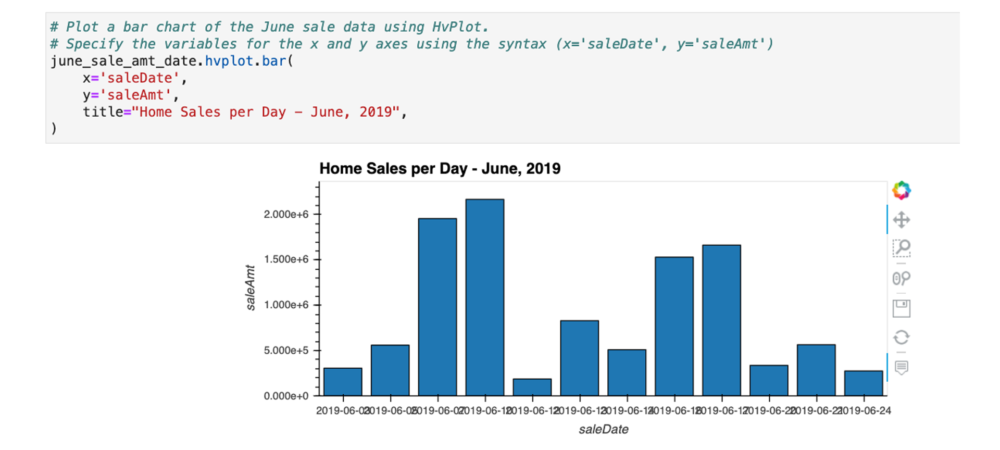

At a glance, we can notice that this plot has two issues. First, the dates on the x-axis overlap, making them hard to read. Second, the information on the y-axis is hard to understand, because the chart displays them in an undecipherable numerical format.

We need to fix the issues on the x- and y-axes so that the audience of the visualization can interpret it. This is where visualization options come into play.

Let’s review some of the available options for improving this visualization.

# Add Formatting Options.

We intend our visualizations to communicate information to an audience. Therefore, it’s important that the visualizations be clear. For example, if your audience can’t read the dates or interpret the numbers that are associated with your plot, they won’t understand the story that your visualization is trying to convey.

Formatting options, like those for the rotation, axes labels, titles, and axes inversion, help make visualizations easily digestible to your audience. Visualization libraries like hvPlot provide these options.


## Use Rotation.

People commonly use rotation as a visualization enhancement. As its name suggests, this option rotates an axis tick mark by the number of degrees that you specify. The rotation option often improves the readability of axes tick marks. This is especially true when you’re dealing with large sets of data that end up closely spaced along an axis, such as dates in a time series dataset.

Let’s review the plot again. The following image shows the same plot from before:

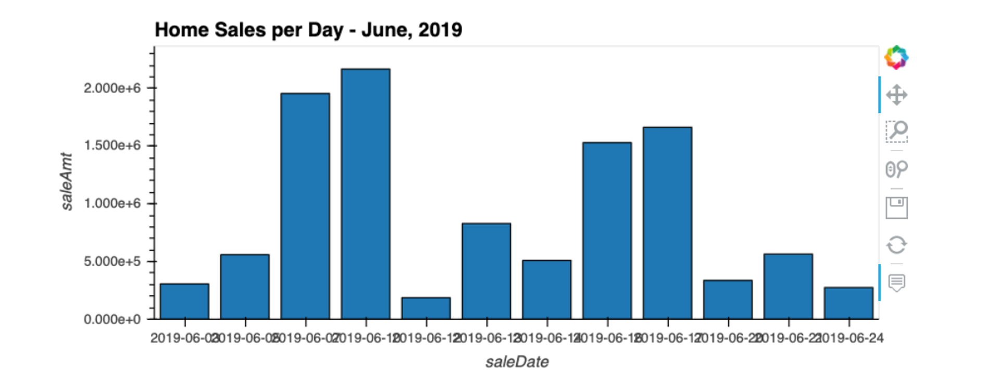

Many people will find the x-axis tick marks more readable if we rotate them by 90 degrees so that they display vertically rather than horizontally. To do this, we pass the `rot=90` parameter to the plotting function, as the following code shows:

In [ ]:
# Plot a bar chart of the June sale data using hvPlot.
# Specify the variables for the x and y axes using the syntax (x='saleDate', y='saleAmt')
# Include rotation of x-axis labels
june_sale_amt_date.hvplot.bar(
    x='saleDate',
    y='saleAmt',
    title="Home Sales per Day - June, 2019",
    rot=90 ## <------------------------------------------------
)

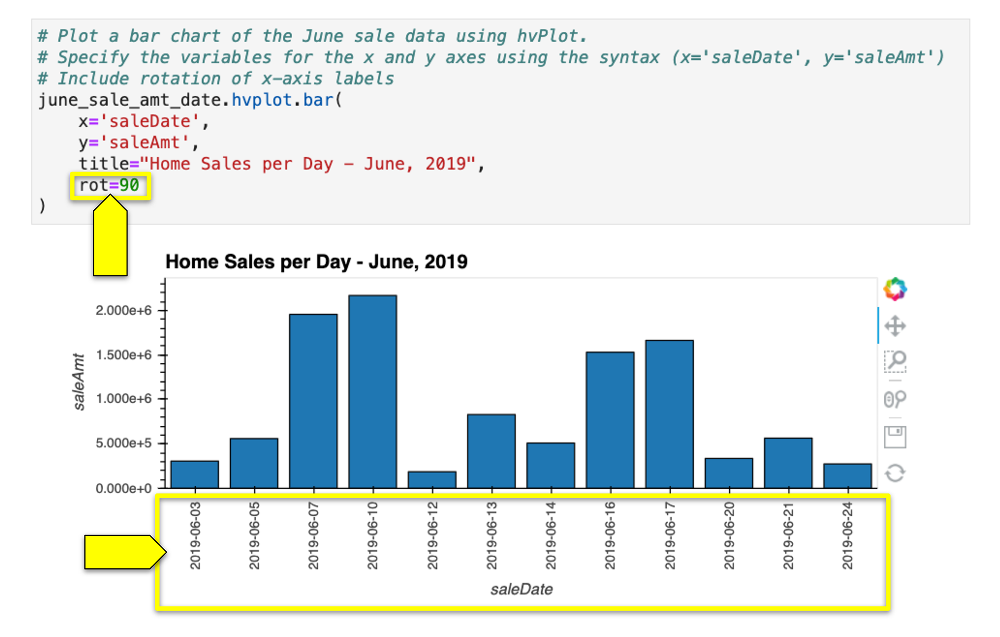

This change has significantly improved the readability of the visualization and will allow many users to gain insight from each axis point along the x-axis.

This takes care of the x-axis tick marks, so let’s turn our attention to the formatting of the numbers along the y-axis.

## Use Formatters.

With the `.opts(xformatter)` and `.opts(yformatter)` options in hvPlot, you can format label values. To do that, you use syntax that’s similar to the syntax for rounding the decimal places of a variable inside an f-string.

Let's review our chart again. Notice that the tick marks on the y-axis use scientific notation for the numbers, as the following image shows:

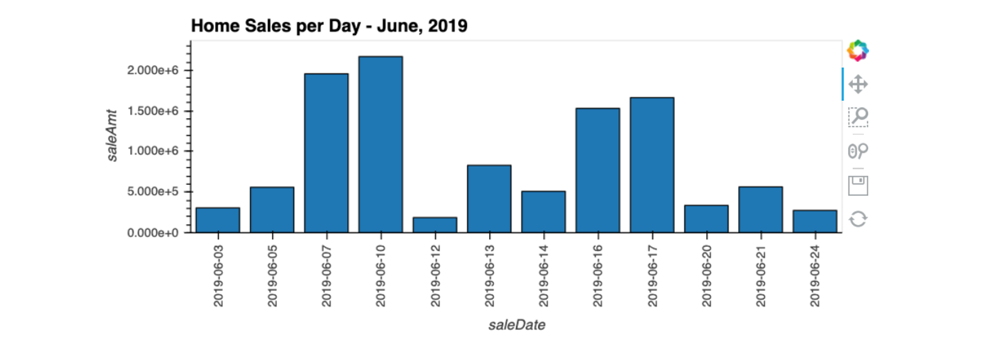


We can use formatters to adjust how the numbers on the y-axis display, which will make the chart scale easier to interpret. To do so, we need to round the labels for the y-axis amounts to whole numbers. We’ll thus add `opts(yformatter='%.0f')` to the end of the code for the plot, as the following code shows:

In [ ]:
# Plot a bar chart of the June sale data using hvPlot.
# Specify the variables for the x and y axes using the syntax (x='saleDate', y='saleAmt')
# Include rotation of x-axis labels
# Include a y-formatter that rounds the y-axis labels to the whole number
june_sale_amt_date.hvplot.bar(
    x='saleDate',
    y='saleAmt',
    title="Home Sales per Day - June, 2019",
    rot=90
).opts(yformatter='%.0f')

The following image shows the updated plot:

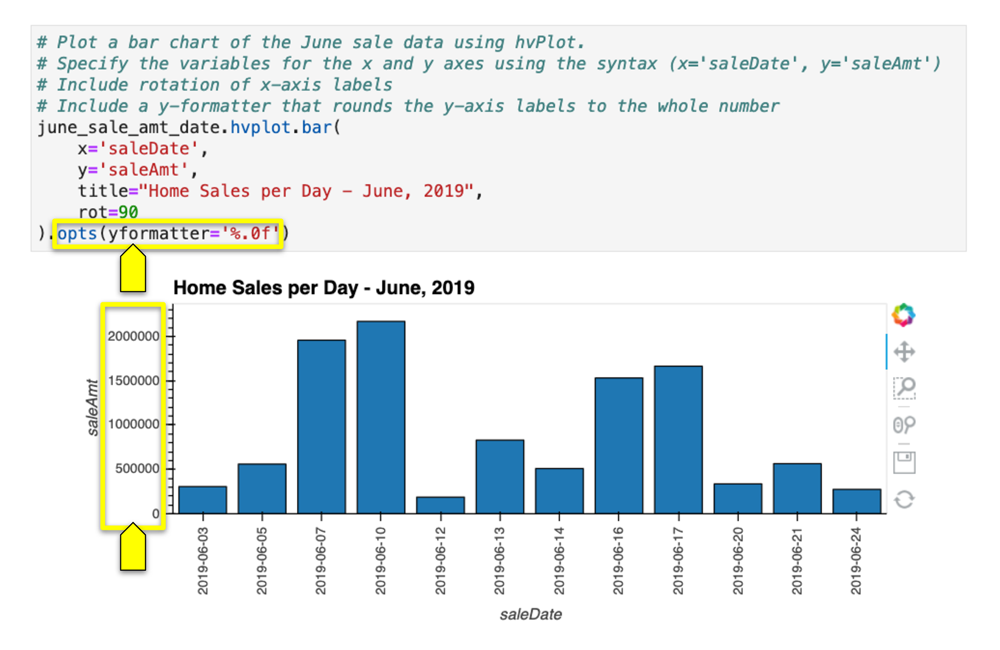

With the y-axis labels now rounded to whole numbers, we can determine the value of the homes that were sold on each day. June 7 and June 10 seem like solid days, with almost $2 million in sales for each day. However, those days are offset by eight days of less than $500,000 each. With the number of light-to-heavy selling days leaning toward the light side, it appears that the Arlington, Virginia housing market was quite slow. But, we still have more work to do on the visualization before we can present the findings.

-- Stopped here. https://courses.bootcampspot.com/courses/800/pages/6-dot-3-2-creating-customized-visualizations?module_item_id=235284